In [1]:
import pandas as pd
import os

In [5]:
import os
import pandas as pd

base_path = r"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\CAMELS_V2.2"

# Read gauge-basin mapping
df_summary = pd.read_csv(rf'{base_path}\attributes_csv\camels_ind_name.csv')
df_basin_map = df_summary[["gauge_id", "river_basin", "flow_availability"]]
df_basin_map = df_basin_map[df_basin_map["flow_availability"] >= 90].copy()

# Read area info
df_attributes = pd.read_csv(rf'{base_path}\attributes_csv\camels_ind_topo.csv')[["gauge_id", "cwc_area"]]
df_basin_map = pd.merge(df_basin_map, df_attributes, on="gauge_id", how="left")

# Read streamflow data
streamflow_df = pd.read_csv(rf'{base_path}\streamflow_timeseries\streamflow_observed.csv')
streamflow_df["Date"] = pd.to_datetime(streamflow_df[["year", "month", "day"]])
streamflow_df = streamflow_df[(streamflow_df["Date"] >= "1980-01-01") & (streamflow_df["Date"] <= "2018-12-31")]
streamflow_df.fillna(method='ffill', inplace=True)
streamflow_df.fillna(method='bfill', inplace=True)

# Dictionary to collect data by basin
basin_data = {}

for _, row in df_basin_map.iterrows():
    gauge_id = row["gauge_id"]
    basin = row["river_basin"]
    area = row["cwc_area"]
    file_path = f'{base_path}/catchment_mean_forcings/{gauge_id:05d}.csv'

    if not os.path.exists(file_path):
        print(f"File not found: {file_path}")
        continue

    precip_df = pd.read_csv(file_path)
    precip_df["Date"] = pd.to_datetime(precip_df[["year", "month", "day"]])
    precip_df = precip_df[(precip_df["Date"] >= "1980-01-01") & (precip_df["Date"] <= "2018-12-31")]

    # Annual sums
    annual_precip = precip_df.groupby('year')['prcp(mm/day)'].sum().reset_index()
    annual_precip.rename(columns={'prcp(mm/day)': 'Annual_P'}, inplace=True)

    annual_AET = precip_df.groupby('year')['aet_gleam(mm/day)'].sum().reset_index()
    annual_AET.rename(columns={'aet_gleam(mm/day)': 'Annual_AET'}, inplace=True)

    if str(gauge_id) in streamflow_df.columns:
        stream_mm = streamflow_df[['year', 'month', 'day', str(gauge_id)]].copy()
        stream_mm[str(gauge_id)] = stream_mm[str(gauge_id)] * 86400 / (area * 1000)
        annual_streamflow = stream_mm.groupby('year')[str(gauge_id)].sum().reset_index()
        annual_streamflow.rename(columns={str(gauge_id): 'Annual_Q'}, inplace=True)
    else:
        continue  # skip if no streamflow

    # Monsoon season filter (June 1 to Sept 30)
    monsoon_mask = (precip_df['Date'].dt.month >= 6) & (precip_df['Date'].dt.month <= 9)

    monsoon_precip = precip_df[monsoon_mask].groupby('year')['prcp(mm/day)'].sum().reset_index()
    monsoon_precip.rename(columns={'prcp(mm/day)': 'Msum_P'}, inplace=True)

    monsoon_AET = precip_df[monsoon_mask].groupby('year')['aet_gleam(mm/day)'].sum().reset_index()
    monsoon_AET.rename(columns={'aet_gleam(mm/day)': 'Msum_AET'}, inplace=True)

    monsoon_stream = stream_mm[monsoon_mask].groupby('year')[str(gauge_id)].sum().reset_index()
    monsoon_stream.rename(columns={str(gauge_id): 'Msum_Q'}, inplace=True)

    # Merge all results
    merged = annual_streamflow.merge(annual_precip, on='year') \
                              .merge(annual_AET, on='year') \
                              .merge(monsoon_stream, on='year') \
                              .merge(monsoon_precip, on='year') \
                              .merge(monsoon_AET, on='year')

    merged = merged[merged["Annual_Q"] != 0]

    # Store in basin dictionary
    if basin not in basin_data:
        basin_data[basin] = {}
    basin_data[basin][str(gauge_id)] = merged

# Save to Excel files (overwrite existing)
for basin, gauges in basin_data.items():
    with pd.ExcelWriter(rf"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Q\{basin}.xlsx") as writer:
        for gauge_id, df in gauges.items():
            df.to_excel(writer, sheet_name=str(gauge_id), index=False)


C:\Users\PPOSA\AppData\Local\Temp\ipykernel_5184\3783531087.py:19: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  streamflow_df.fillna(method='ffill', inplace=True)
C:\Users\PPOSA\AppData\Local\Temp\ipykernel_5184\3783531087.py:20: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  streamflow_df.fillna(method='bfill', inplace=True)


In [10]:
import os
import pandas as pd

base_path = r"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\CAMELS_V2.2"

# Read gauge-basin mapping
df_summary = pd.read_csv(rf'{base_path}\attributes_csv\camels_ind_name.csv')
df_basin_map = df_summary[["gauge_id", "river_basin", "flow_availability"]]
df_basin_map = df_basin_map[df_basin_map["flow_availability"] >= 90].copy()

# Read area info
df_attributes = pd.read_csv(rf'{base_path}\attributes_csv\camels_ind_topo.csv')[["gauge_id", "cwc_area"]]
df_basin_map = pd.merge(df_basin_map, df_attributes, on="gauge_id", how="left")

# Read streamflow data
streamflow_df = pd.read_csv(rf'{base_path}\streamflow_timeseries\streamflow_observed.csv')
streamflow_df["Date"] = pd.to_datetime(streamflow_df[["year", "month", "day"]])
streamflow_df = streamflow_df[(streamflow_df["Date"] >= "1980-01-01") & (streamflow_df["Date"] <= "2018-12-31")]
streamflow_df.fillna(method='ffill', inplace=True)
streamflow_df.fillna(method='bfill', inplace=True)

# Dictionary to collect data by basin
basin_data = {}

for _, row in df_basin_map.iterrows():
    gauge_id = row["gauge_id"]
    basin = row["river_basin"]
    area = row["cwc_area"]
    file_path = f'{base_path}/catchment_mean_forcings/{gauge_id:05d}.csv'

    if not os.path.exists(file_path):
        print(f"File not found: {file_path}")
        continue

    precip_df = pd.read_csv(file_path)
    precip_df["Date"] = pd.to_datetime(precip_df[["year", "month", "day"]])
    precip_df = precip_df[(precip_df["Date"] >= "1980-01-01") & (precip_df["Date"] <= "2018-12-31")]

    # --- Prepare streamflow in mm/day ---
    if str(gauge_id) not in streamflow_df.columns:
        continue  # skip if no streamflow

    stream_mm = streamflow_df[['Date', 'year', 'month', 'day', str(gauge_id)]].copy()
    stream_mm[str(gauge_id)] = stream_mm[str(gauge_id)] * 86400 / (area * 1000)

    # --- Annual sums ---
    annual_precip = precip_df.groupby('year')['prcp(mm/day)'].sum().reset_index().rename(columns={'prcp(mm/day)': 'Annual_P'})
    annual_AET = precip_df.groupby('year')['aet_gleam(mm/day)'].sum().reset_index().rename(columns={'aet_gleam(mm/day)': 'Annual_AET'})
    annual_streamflow = stream_mm.groupby('year')[str(gauge_id)].sum().reset_index().rename(columns={str(gauge_id): 'Annual_Q'})

    # --- Monsoon sums (June–Sept) ---
    monsoon_mask = (precip_df['Date'].dt.month >= 6) & (precip_df['Date'].dt.month <= 9)

    monsoon_precip = precip_df[monsoon_mask].groupby('year')['prcp(mm/day)'].sum().reset_index().rename(columns={'prcp(mm/day)': 'Msum_P'})
    monsoon_AET = precip_df[monsoon_mask].groupby('year')['aet_gleam(mm/day)'].sum().reset_index().rename(columns={'aet_gleam(mm/day)': 'Msum_AET'})
    monsoon_stream = stream_mm[monsoon_mask].groupby('year')[str(gauge_id)].sum().reset_index().rename(columns={str(gauge_id): 'Msum_Q'})

    # --- Merge year-based results ---
    merged = annual_streamflow.merge(annual_precip, on='year') \
                              .merge(annual_AET, on='year') \
                              .merge(monsoon_stream, on='year') \
                              .merge(monsoon_precip, on='year') \
                              .merge(monsoon_AET, on='year')
    merged = merged[merged["Annual_Q"] != 0]

    # --- Long-term daily climatology (June 1 – Sept 30) ---
    # Precip
    precip_monsoon = precip_df[monsoon_mask].copy()
    precip_monsoon["doy"] = precip_monsoon["Date"].dt.strftime("%m-%d")
    ltm_P = precip_monsoon.groupby("doy")["prcp(mm/day)"].mean().reset_index()

    # AET
    aet_monsoon = precip_df[monsoon_mask].copy()
    aet_monsoon["doy"] = aet_monsoon["Date"].dt.strftime("%m-%d")
    ltm_AET = aet_monsoon.groupby("doy")["aet_gleam(mm/day)"].mean().reset_index()

    # Q
    stream_monsoon = stream_mm[monsoon_mask].copy()
    stream_monsoon["doy"] = stream_monsoon["Date"].dt.strftime("%m-%d")
    ltm_Q = stream_monsoon.groupby("doy")[str(gauge_id)].mean().reset_index()

    # Merge LTM climatology
    ltm_df = ltm_Q.merge(ltm_P, on="doy").merge(ltm_AET, on="doy")
    ltm_df.rename(columns={
        str(gauge_id): "ltm_Q",
        "prcp(mm/day)": "ltm_P",
        "aet_gleam(mm/day)": "ltm_AET"
    }, inplace=True)

    # --- Save both merged (39 years) and ltm (122 days) in same sheet ---
    # Concatenate with different lengths (pandas aligns by index, so reset)
    out_df = pd.concat([merged.reset_index(drop=True), ltm_df.reset_index(drop=True)], axis=1)

    # Store in basin dictionary
    if basin not in basin_data:
        basin_data[basin] = {}
    basin_data[basin][str(gauge_id)] = out_df

# --- Save to Excel files ---
for basin, gauges in basin_data.items():
    with pd.ExcelWriter(rf"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Q\{basin}.xlsx") as writer:
        for gauge_id, df in gauges.items():
            df.to_excel(writer, sheet_name=str(gauge_id), index=False)


C:\Users\PPOSA\AppData\Local\Temp\ipykernel_5184\776386012.py:19: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  streamflow_df.fillna(method='ffill', inplace=True)
C:\Users\PPOSA\AppData\Local\Temp\ipykernel_5184\776386012.py:20: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  streamflow_df.fillna(method='bfill', inplace=True)


In [6]:
import os
import pandas as pd

# Path where the basin Excel files are stored
q_folder = r"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Q"

summary_records = []

# Loop through all Excel files in Q folder
for file in os.listdir(q_folder):
    if file.endswith(".xlsx"):
        basin_name = os.path.splitext(file)[0]  # file name without extension
        file_path = os.path.join(q_folder, file)
        
        # Read all sheets (stations)
        xls = pd.ExcelFile(file_path)
        for sheet_name in xls.sheet_names:
            df = pd.read_excel(file_path, sheet_name=sheet_name)
            
            # Ensure required columns exist
            if not all(col in df.columns for col in ["year", "Annual_Q", "Annual_P", "Annual_AET"]):
                continue  # skip if missing columns
            
            start_year = int(df["year"].min())
            end_year = int(df["year"].max())
            data_length = len(df["year"].unique())
            
            min_Q, max_Q = df["Annual_Q"].min(), df["Annual_Q"].max()
            min_P, max_P = df["Annual_P"].min(), df["Annual_P"].max()
            min_AET, max_AET = df["Annual_AET"].min(), df["Annual_AET"].max()
            
            summary_records.append({
                "Basin": basin_name,
                "Gauge_ID": sheet_name,
                "Start_Year": start_year,
                "End_Year": end_year,
                "Data_Length_Years": data_length,
                "Min_Annual_Q": min_Q,
                "Max_Annual_Q": max_Q,
                "Min_Annual_P": min_P,
                "Max_Annual_P": max_P,
                "Min_Annual_AET": min_AET,
                "Max_Annual_AET": max_AET
            })

# Create summary DataFrame
summary_df = pd.DataFrame(summary_records)

# Save summary to Excel
summary_path = r"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Basin_Station_Summary.xlsx"
summary_df.to_excel(summary_path, index=False)

print(f"Summary saved to: {summary_path}")

Summary saved to: C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Basin_Station_Summary.xlsx


In [7]:
display(summary_df)

,Basin,Gauge_ID,Start_Year,End_Year,Data_Length_Years,Min_Annual_Q,Max_Annual_Q,Min_Annual_P,Max_Annual_P,Min_Annual_AET,Max_Annual_AET
0,Brahmani-Baitarani,7002,1980,2018,39,154.455274,1104.009925,1030.67,2020.12,628.76,837.17
1,Brahmani-Baitarani,7007,1980,2018,39,140.083567,1038.008419,933.22,1853.30,571.43,808.67
2,Brahmani-Baitarani,7008,1980,2018,39,119.245111,862.249834,911.68,1798.59,580.55,818.13
3,Brahmani-Baitarani,7009,1980,2018,39,161.504692,888.948976,988.53,1807.14,598.90,794.01
4,Brahmani-Baitarani,7015,1980,2018,39,279.441114,1069.194258,883.27,1805.47,524.82,789.57
...,...,...,...,...,...,...,...,...,...,...,...
85,WFRS,15017,1980,2018,39,439.138593,3728.952154,902.99,3051.59,959.35,1270.80
86,WFRS,15021,1980,2018,39,783.356395,3216.883000,1244.24,3276.56,994.66,1261.64
87,WFRS,15022,1980,2018,39,457.655088,2375.215974,738.15,2721.02,1049.25,1435.70
88,WFRS,15026,1980,2018,39,2436.253987,5215.421563,1802.40,4776.02,1109.48,1455.96


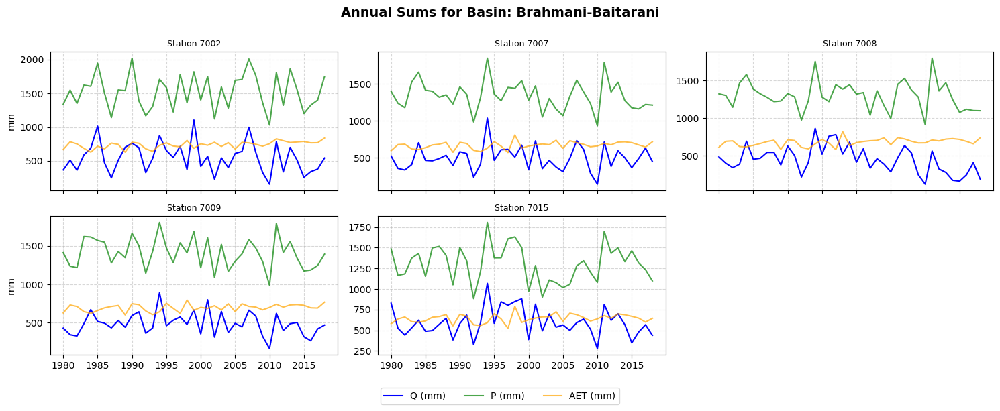

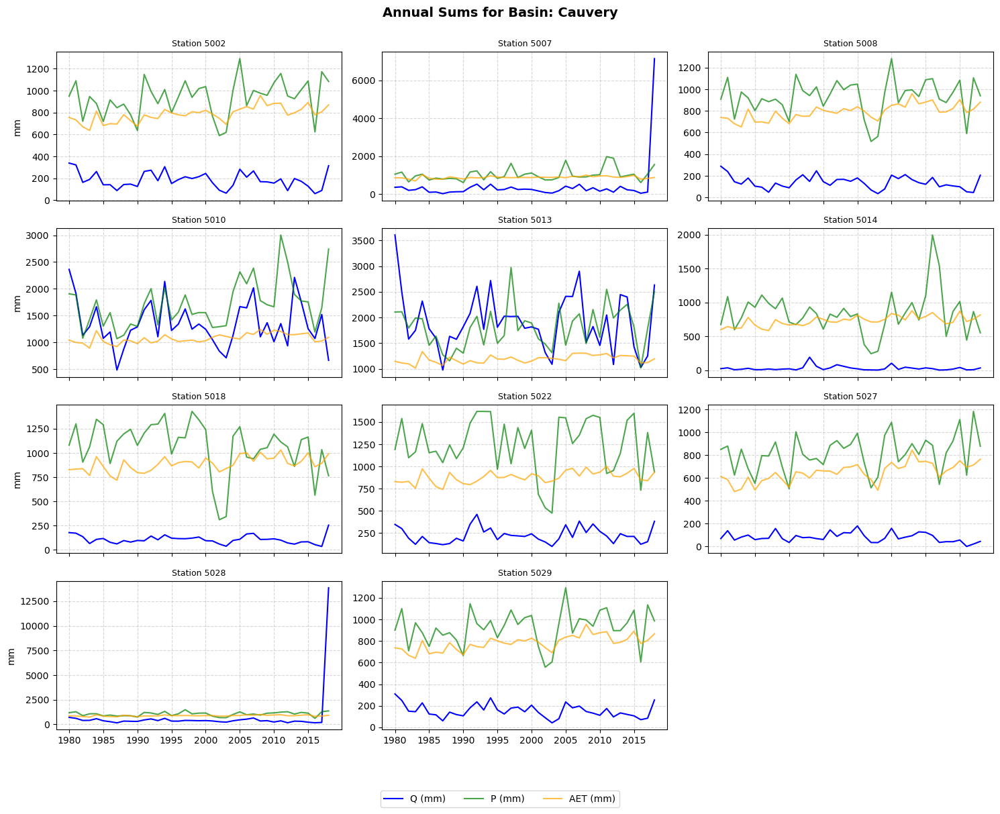

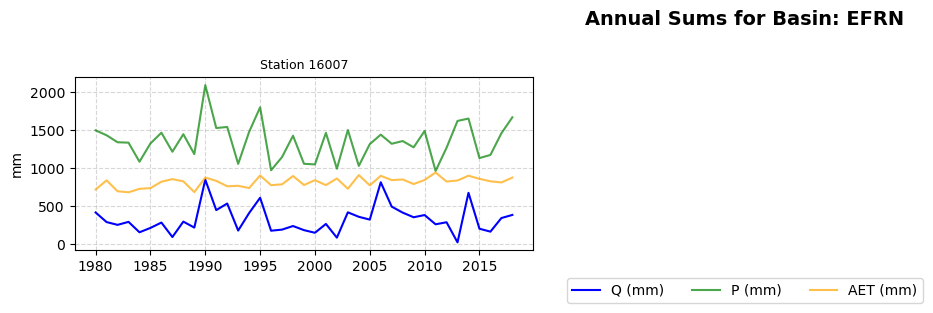

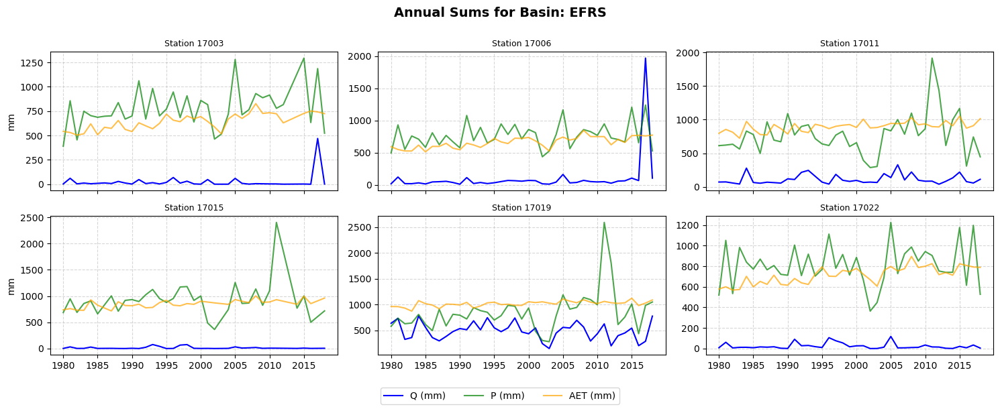

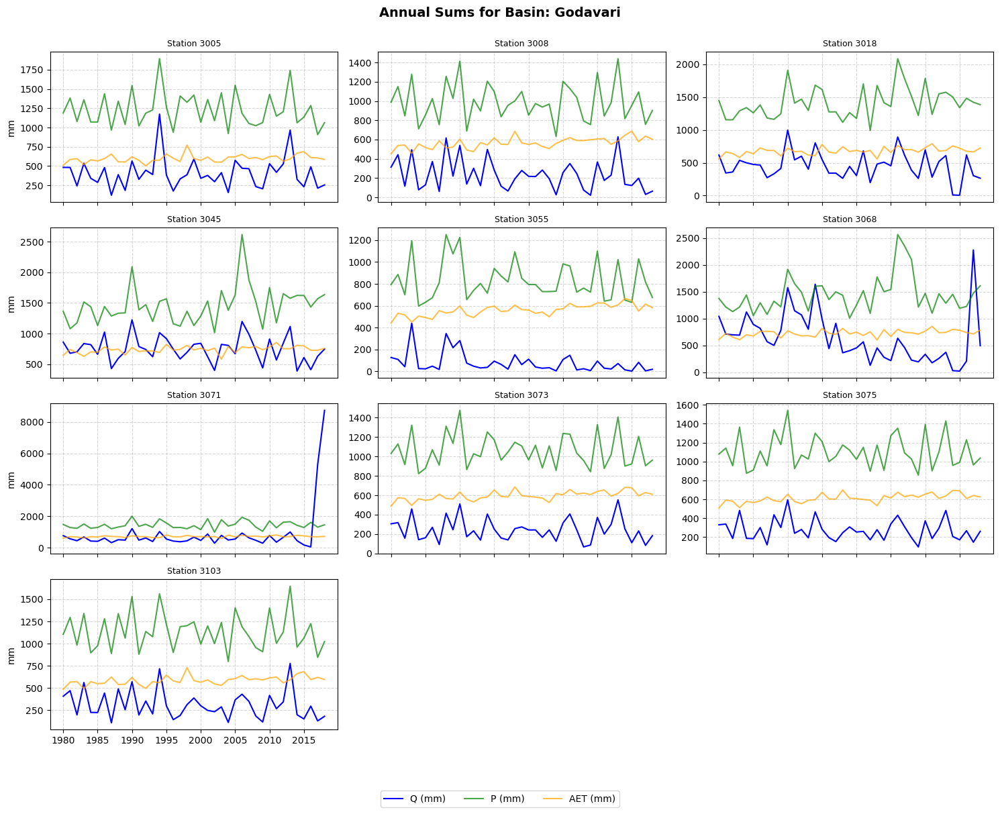

...

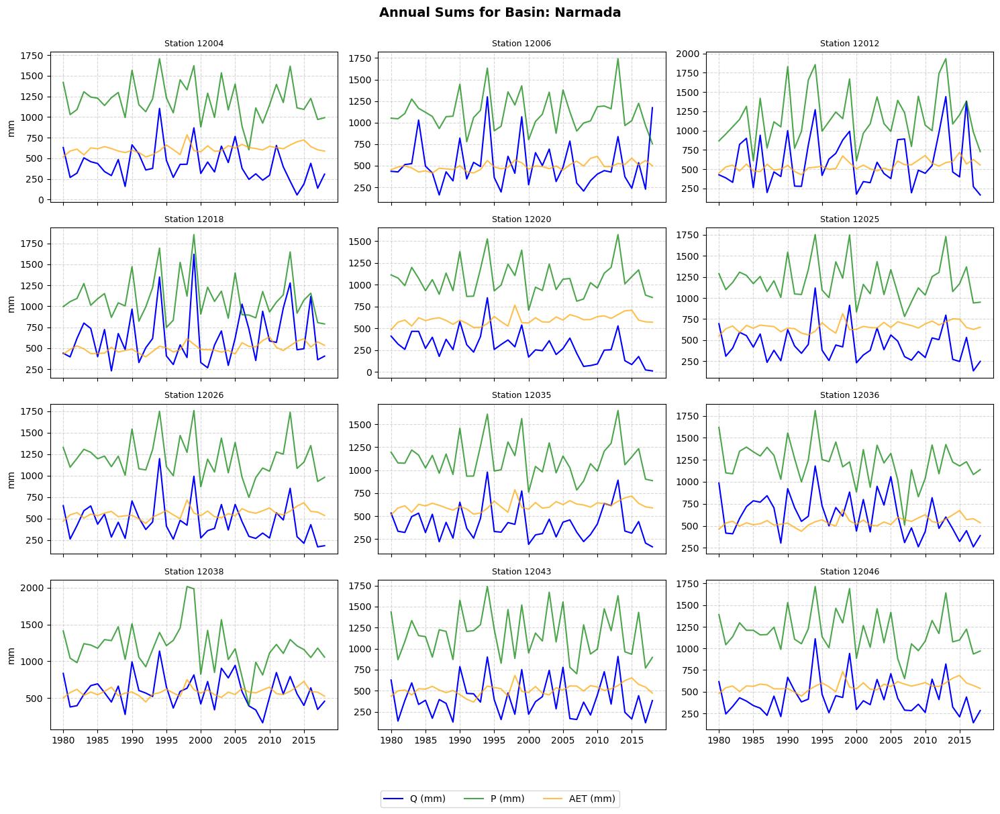

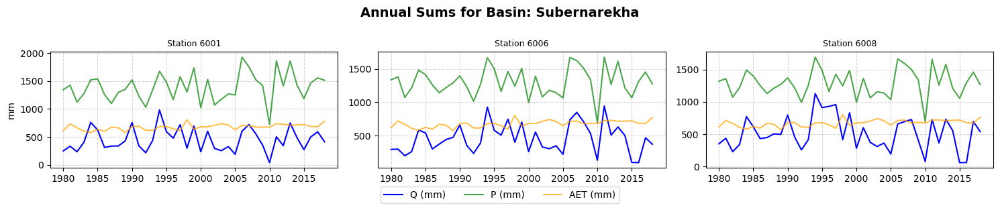

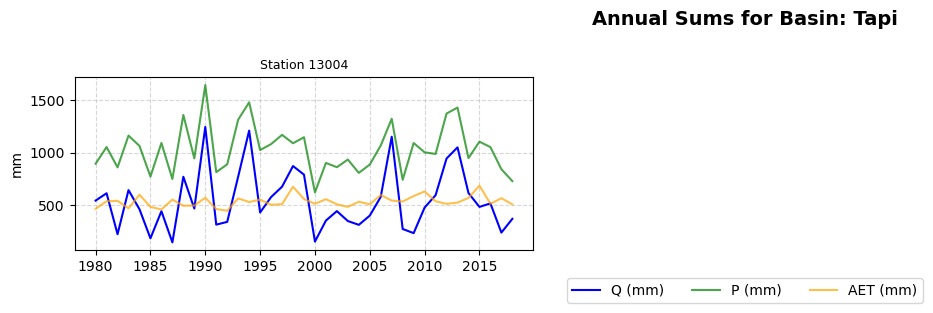

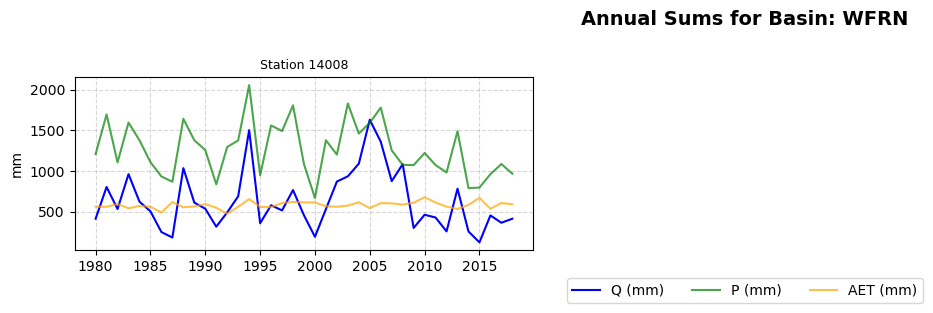

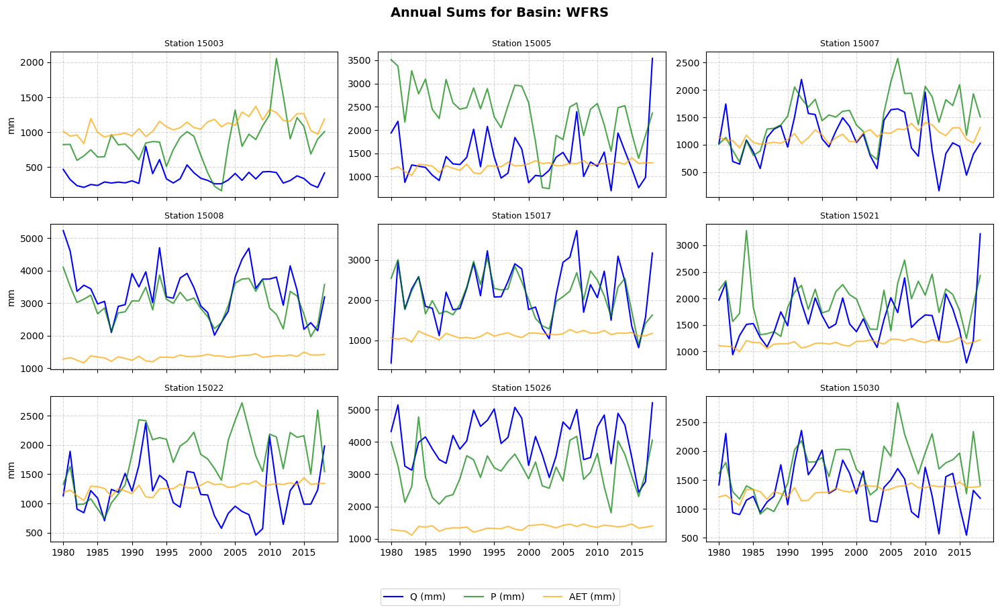

Plots saved to: C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Q\plots


In [15]:
# import os
import pandas as pd
import matplotlib.pyplot as plt
import math

# Paths
q_folder = r"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Q"
plot_folder = os.path.join(q_folder, "plots")
os.makedirs(plot_folder, exist_ok=True)

# Loop through each basin file
for file in os.listdir(q_folder):
    if not file.endswith(".xlsx") or file == "Basin_Station_Summary.xlsx":
        continue

    basin_name = os.path.splitext(file)[0]
    file_path = os.path.join(q_folder, file)
    
    # Read all stations in the basin
    xls = pd.ExcelFile(file_path)
    station_names = xls.sheet_names
    num_stations = len(station_names)
    
    # Arrange subplots in grid
    cols = 3  # adjust based on preference
    rows = math.ceil(num_stations / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3), sharex=True)
    axes = axes.flatten()  # to index subplots easily
    
    for i, station in enumerate(station_names):
        df = pd.read_excel(file_path, sheet_name=station)
        ax = axes[i]
        
        # Plot Annual Q, P, AET
        ax.plot(df["year"], df["Annual_Q"], label="Q (mm)", color="blue")
        ax.plot(df["year"], df["Annual_P"], label="P (mm)", color="green", alpha=0.7)
        ax.plot(df["year"], df["Annual_AET"], label="AET (mm)", color="orange", alpha=0.7)
        
        ax.set_title(f"Station {station}", fontsize=9)
        ax.grid(True, linestyle="--", alpha=0.5)
        if i % cols == 0:
            ax.set_ylabel("mm")
    
    # Remove empty subplots if any
    for j in range(num_stations, len(axes)):
        fig.delaxes(axes[j])
    
    # Add legend only once, place below plots
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower center", ncol=3, bbox_to_anchor=(0.5, -0.02))

    fig.suptitle(f"Annual Sums for Basin: {basin_name}", fontsize=14, fontweight="bold")
    fig.tight_layout(rect=[0, 0.05, 1, 0.98])  # leave bottom 5% space for legend
    
    # Save figure
    save_path = os.path.join(plot_folder, f"{basin_name}_annual_timeseries.png")
    plt.savefig(save_path, dpi=300)
    plt.show(fig)

print(f"Plots saved to: {plot_folder}")

In [15]:
import pandas as pd

summary_path = r"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Basin_Station_Summary.xlsx"

# List of error sites
error_sites = ["17003", "17015", "4054", "5007", "5028", "16007", "17006", "3071", "4013", "4050", "13004", "14008"]

# Filter out error sites
filtered_df = summary_df[~summary_df["Gauge_ID"].astype(str).isin(error_sites)].copy()

# Append filtered data as Sheet2 without overwriting Sheet1
with pd.ExcelWriter(summary_path, mode="a", if_sheet_exists="replace", engine="openpyxl") as writer:
    filtered_df.to_excel(writer, sheet_name="Asum_sites", index=False)

print(f"Filtered data added as Sheet2 in: {summary_path}")


Filtered data added as Sheet2 in: C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Basin_Station_Summary.xlsx


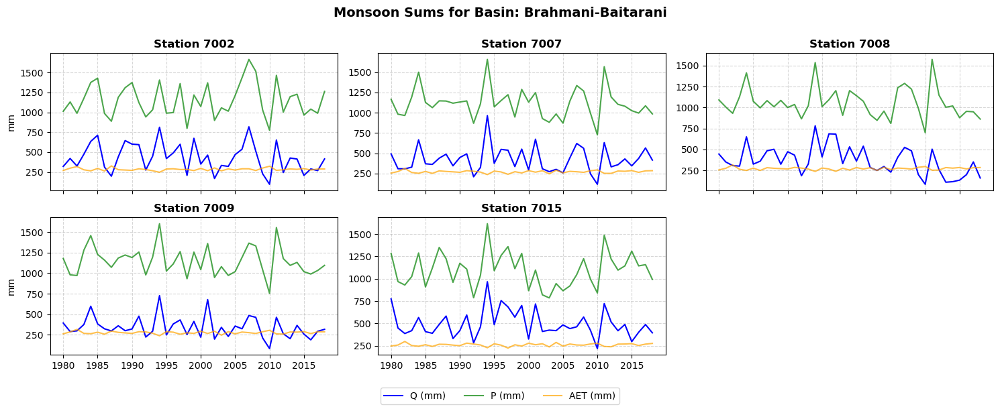

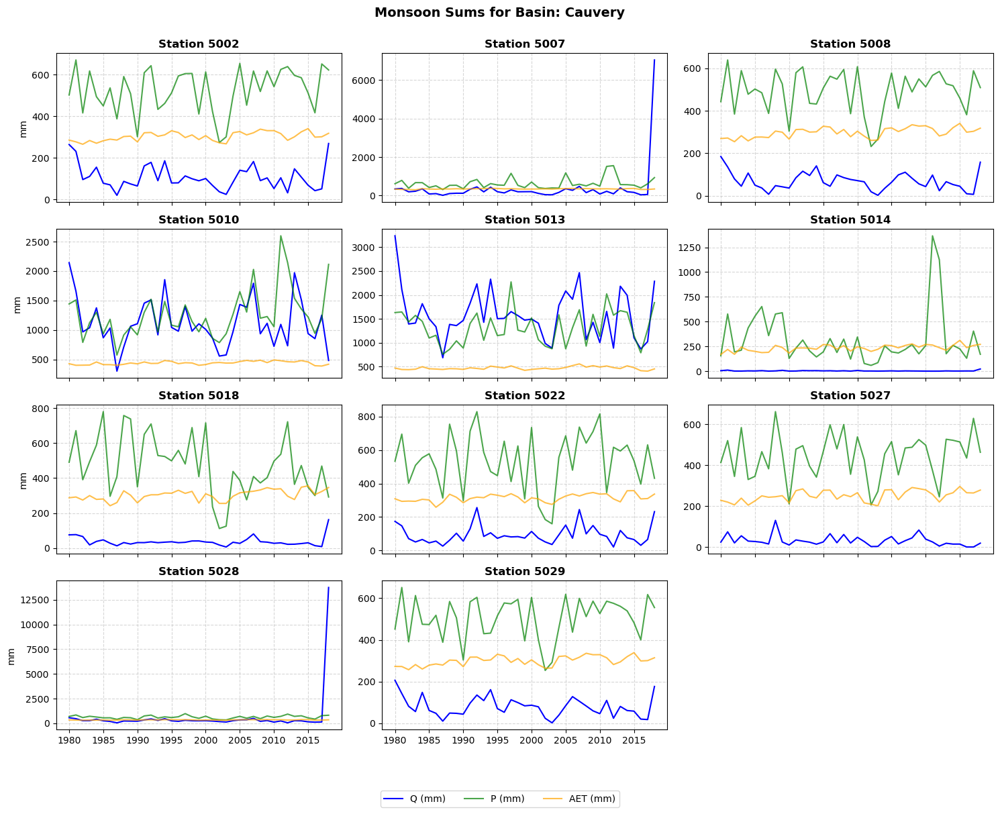

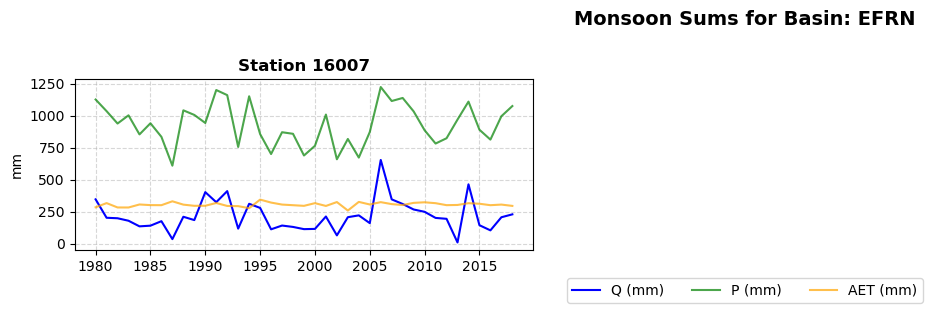

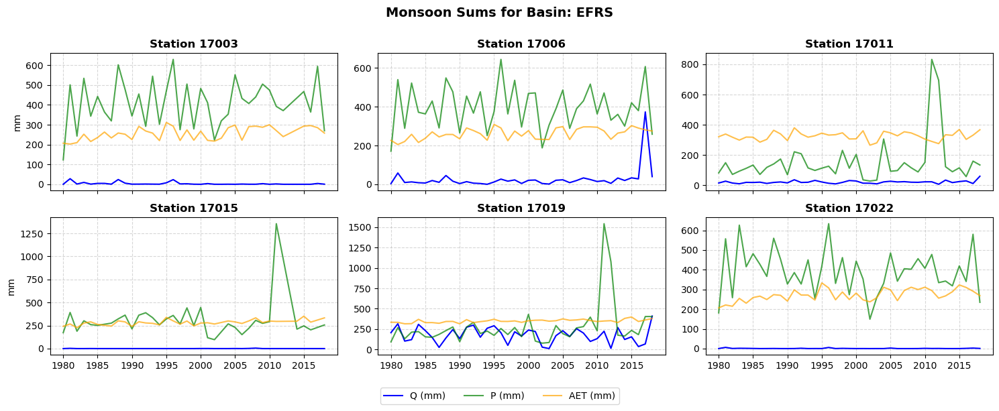

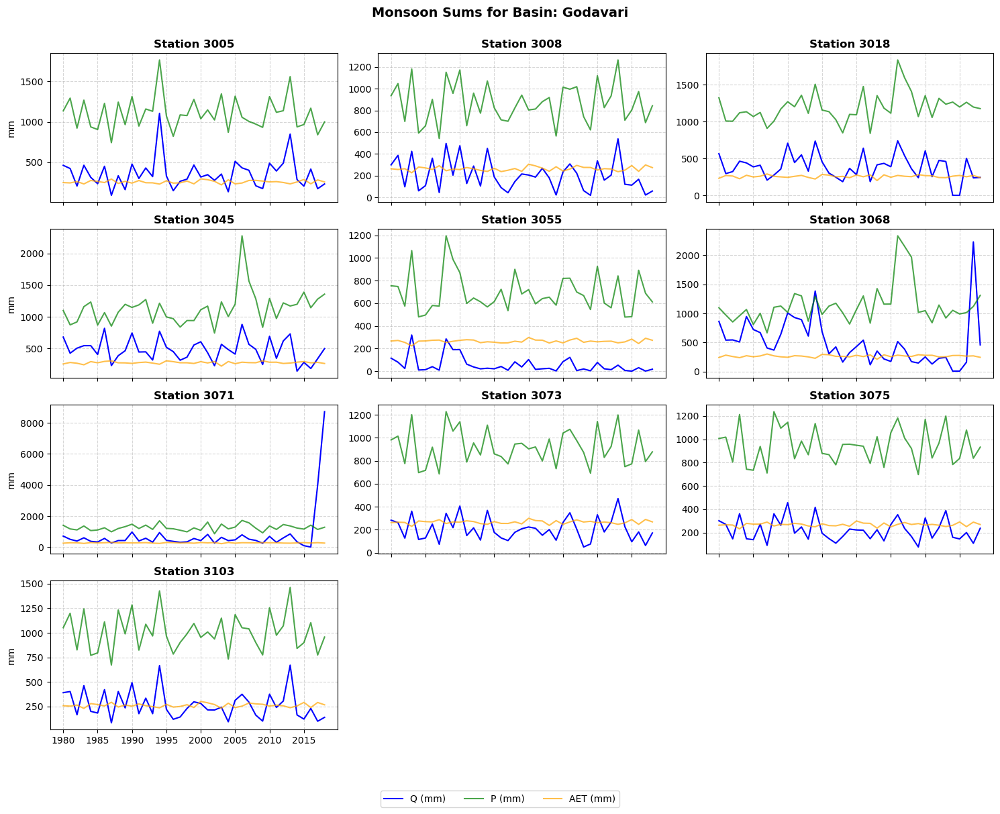

...

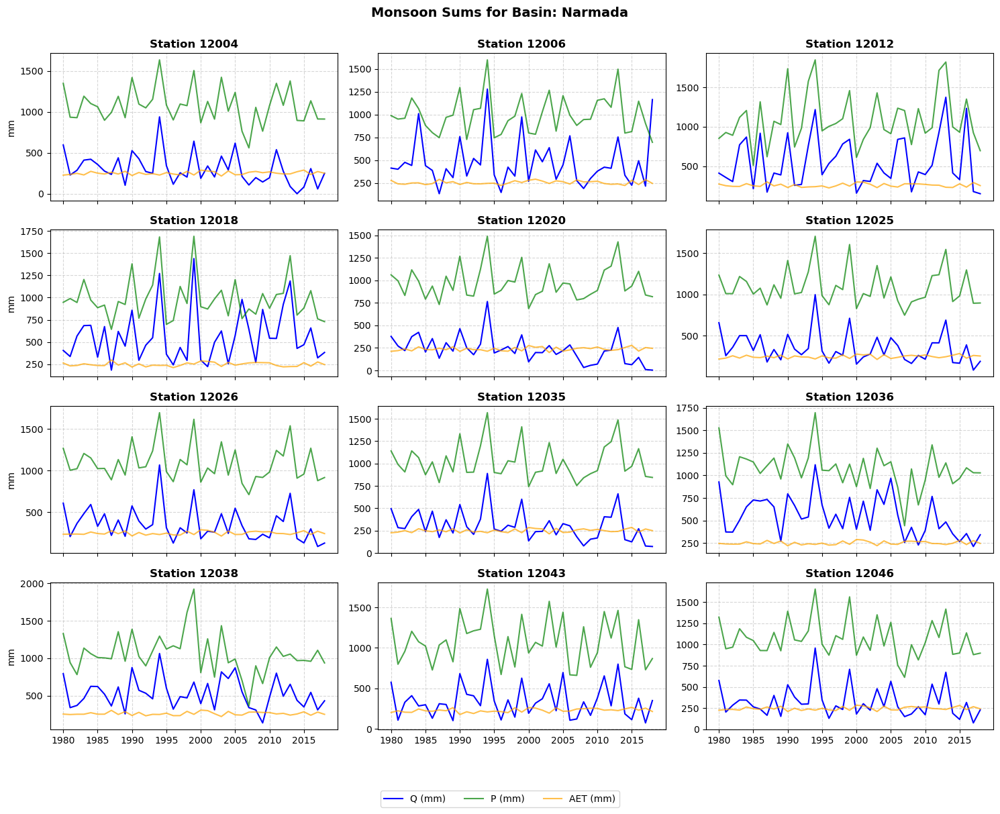

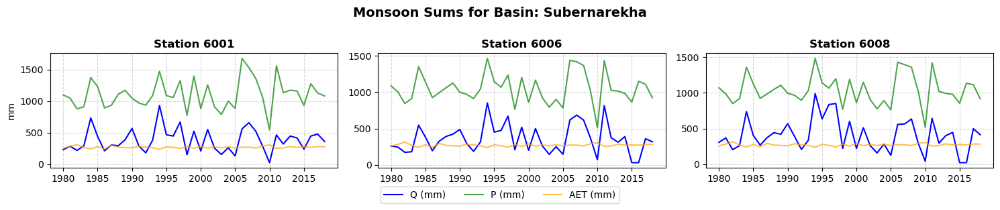

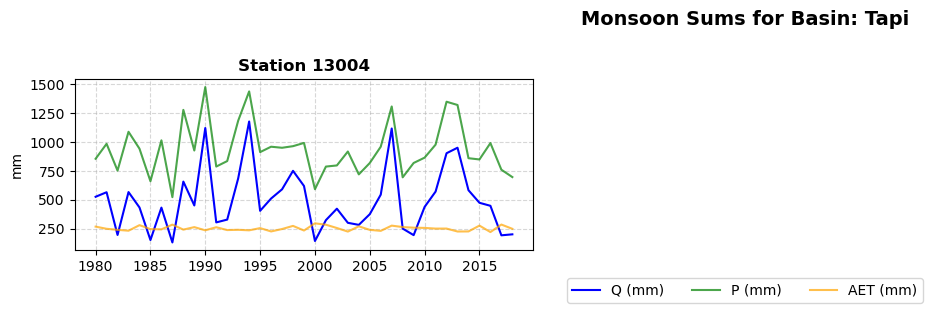

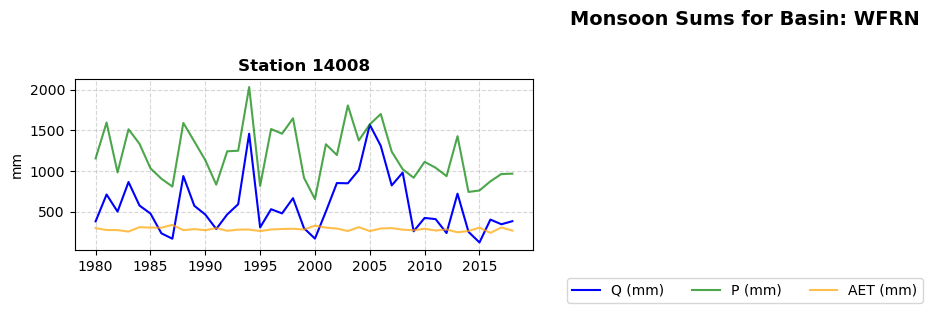

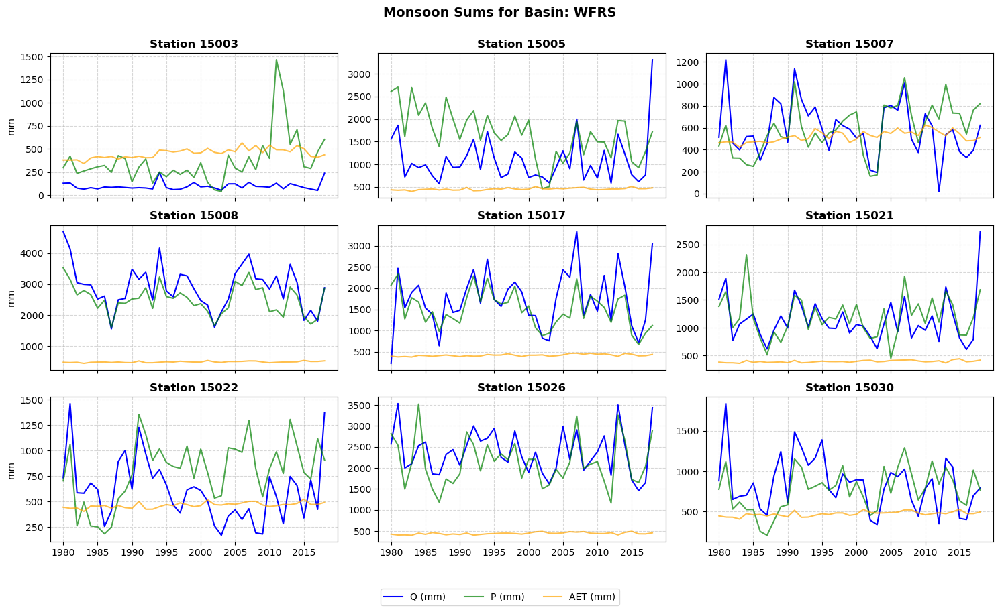

Plots saved to: C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Q\plots


In [11]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import math

# Paths
q_folder = r"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Q"
plot_folder = os.path.join(q_folder, "plots")
os.makedirs(plot_folder, exist_ok=True)

# Loop through each basin file
for file in os.listdir(q_folder):
    if not file.endswith(".xlsx") or file == "Basin_Station_Summary.xlsx":
        continue

    basin_name = os.path.splitext(file)[0]
    file_path = os.path.join(q_folder, file)
    
    # Read all stations in the basin
    xls = pd.ExcelFile(file_path)
    station_names = xls.sheet_names
    num_stations = len(station_names)
    
    # Arrange subplots in grid
    cols = 3  # adjust based on preference
    rows = math.ceil(num_stations / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3), sharex=True)
    axes = axes.flatten()  # to index subplots easily
    
    for i, station in enumerate(station_names):
        df = pd.read_excel(file_path, sheet_name=station)
        ax = axes[i]
        
        # Plot Annual Q, P, AET
        ax.plot(df["year"], df["Msum_Q"], label="Q (mm)", color="blue")
        ax.plot(df["year"], df["Msum_P"], label="P (mm)", color="green", alpha=0.7)
        ax.plot(df["year"], df["Msum_AET"], label="AET (mm)", color="orange", alpha=0.7)
        
        ax.set_title(f"Station {station}", fontsize=12, fontweight="bold")
        ax.grid(True, linestyle="--", alpha=0.5)
        if i % cols == 0:
            ax.set_ylabel("mm")
    
    # Remove empty subplots if any
    for j in range(num_stations, len(axes)):
        fig.delaxes(axes[j])
    
    # Add legend only once, place below plots
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower center", ncol=3, bbox_to_anchor=(0.5, -0.02))

    fig.suptitle(f"Monsoon Sums for Basin: {basin_name}", fontsize=14, fontweight="bold")
    fig.tight_layout(rect=[0, 0.05, 1, 0.98])  # leave bottom 5% space for legend
    
    # Save figure
    save_path = os.path.join(plot_folder, f"{basin_name}_Msum_timeseries.png")
    plt.savefig(save_path, dpi=300)
    plt.show(fig)

print(f"Plots saved to: {plot_folder}")

In [16]:
import pandas as pd

summary_path = r"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Basin_Station_Summary.xlsx"

# List of error sites
error_sites = ["17003", "17015", "4054", "5007", "5028", "16007", "17006", "3071", "4013", "4050", "13004", "14008"]

# Filter out error sites
filtered_df = summary_df[~summary_df["Gauge_ID"].astype(str).isin(error_sites)].copy()

# Append filtered data as Sheet2 without overwriting Sheet1
with pd.ExcelWriter(summary_path, mode="a", if_sheet_exists="replace", engine="openpyxl") as writer:
    filtered_df.to_excel(writer, sheet_name="Msum_sites", index=False)

print(f"Filtered data added as Sheet2 in: {summary_path}")


Filtered data added as Sheet2 in: C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Basin_Station_Summary.xlsx


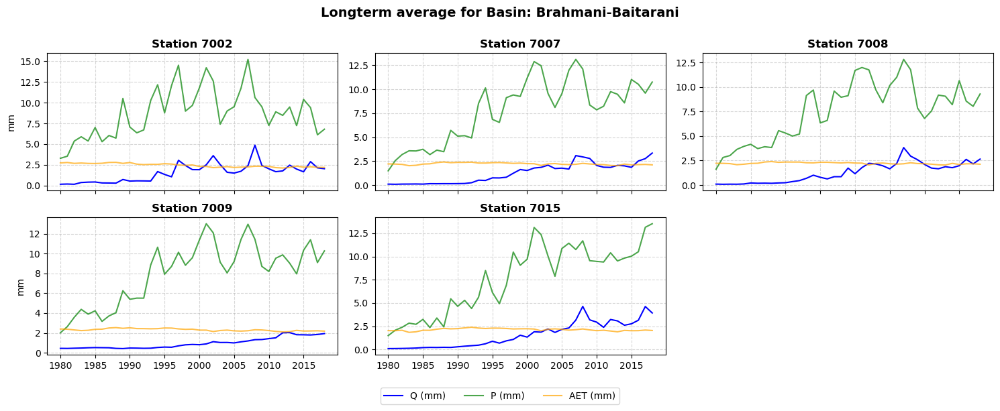

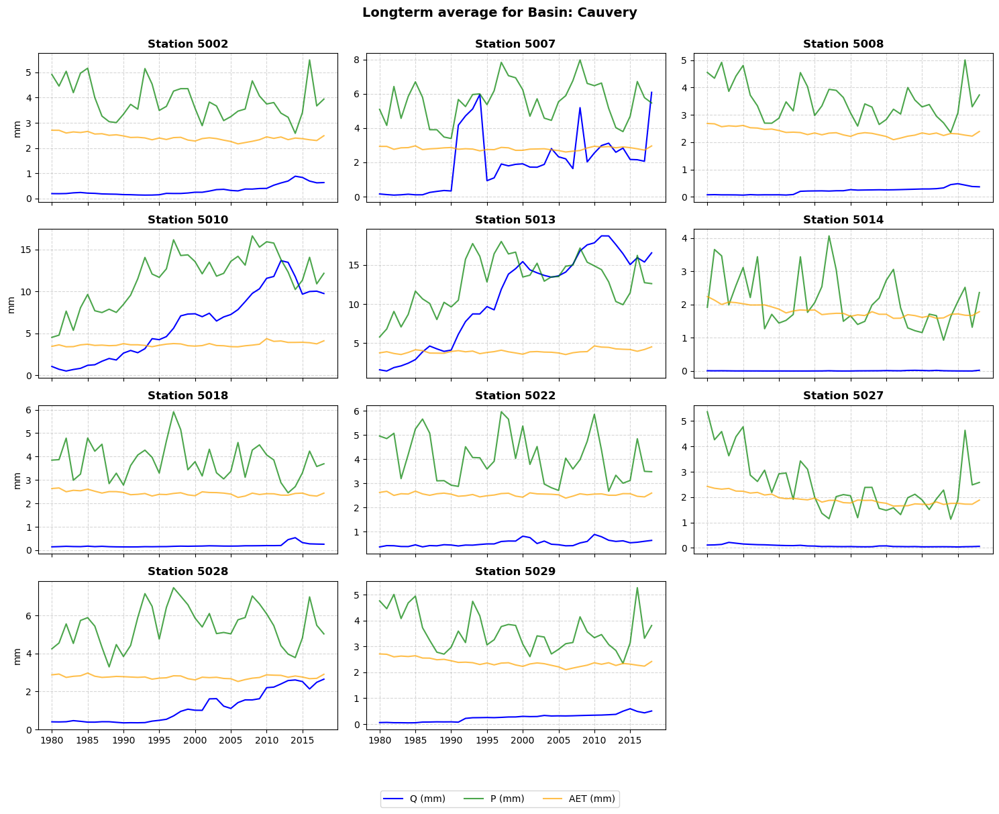

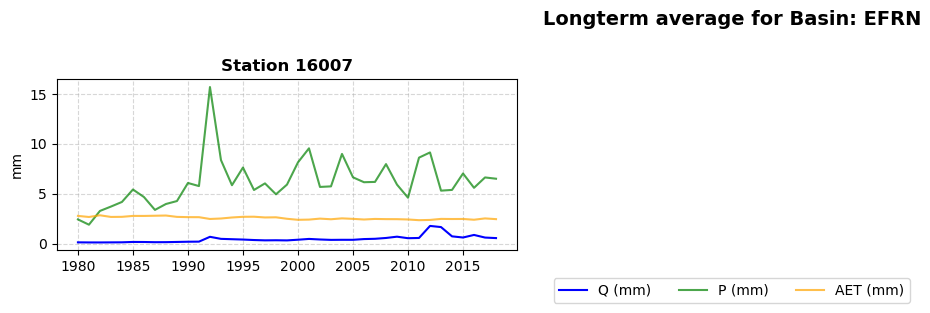

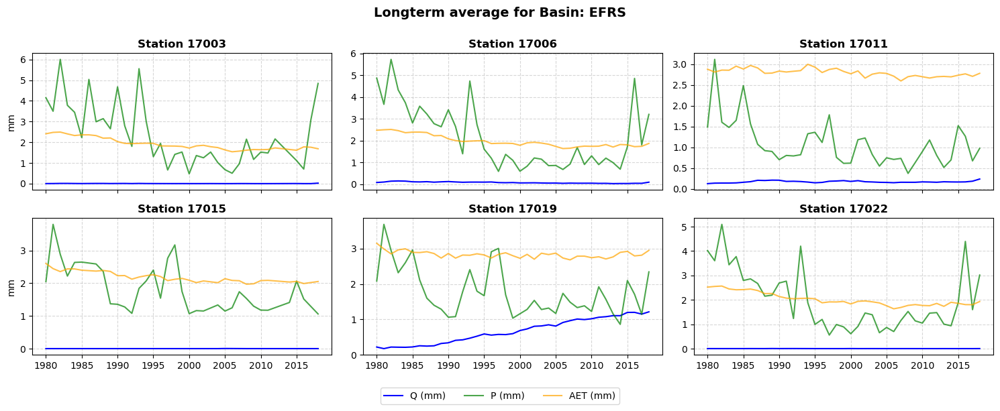

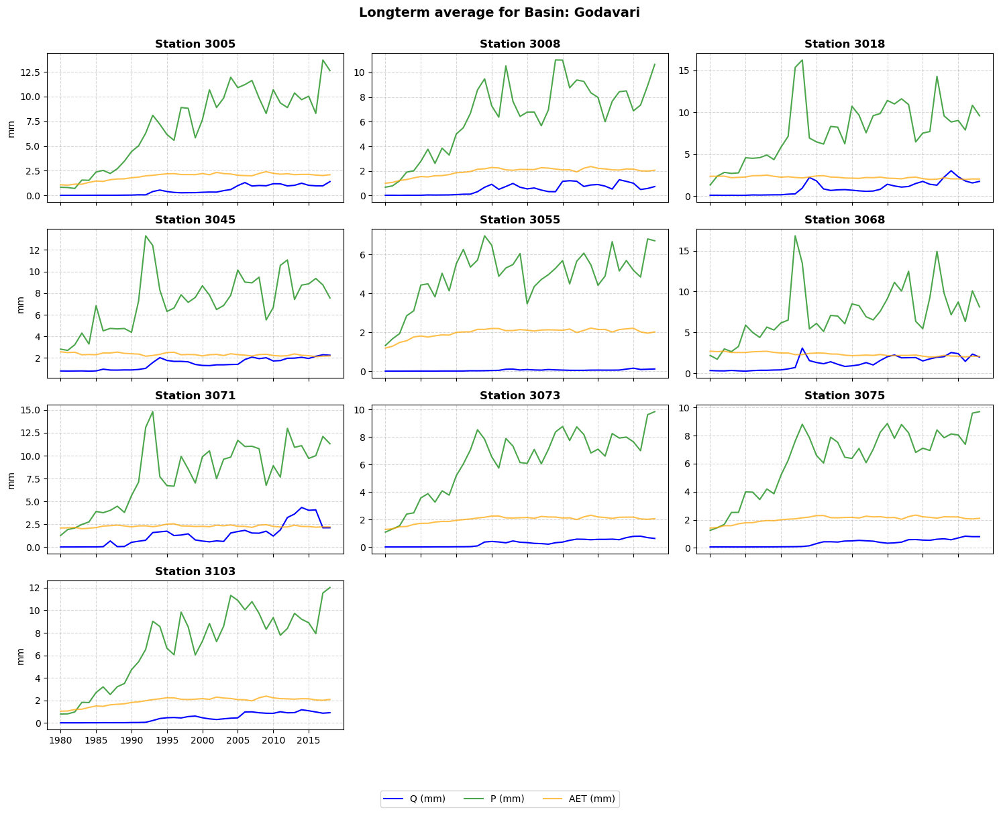

...

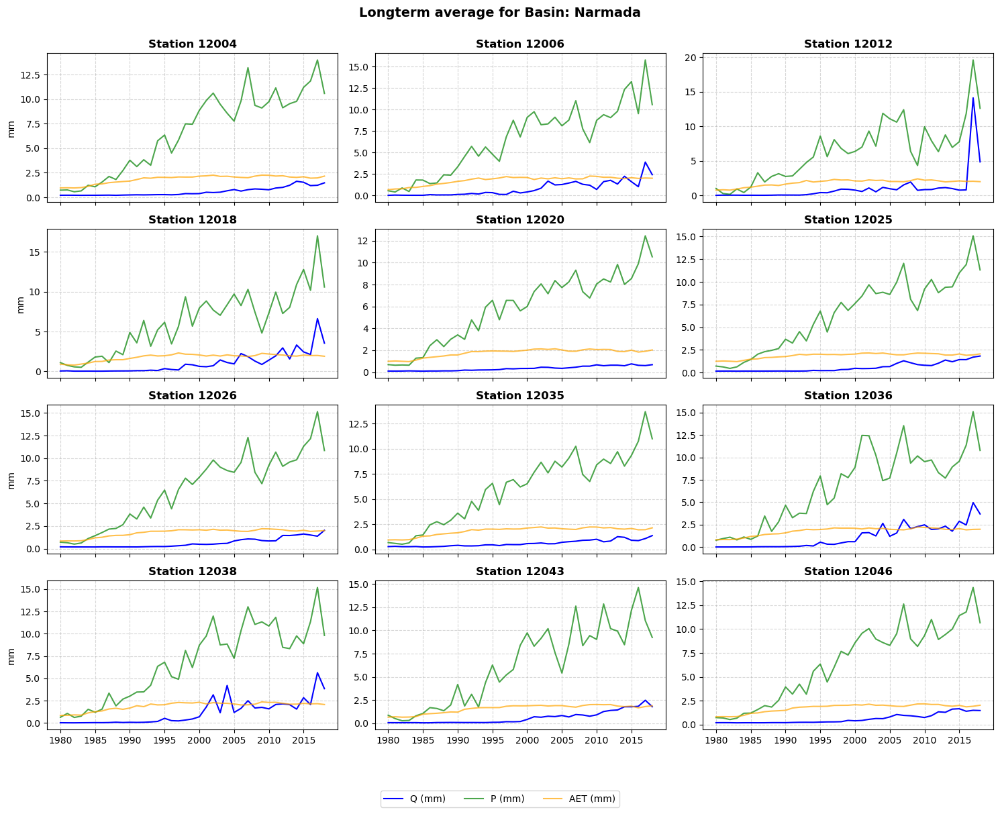

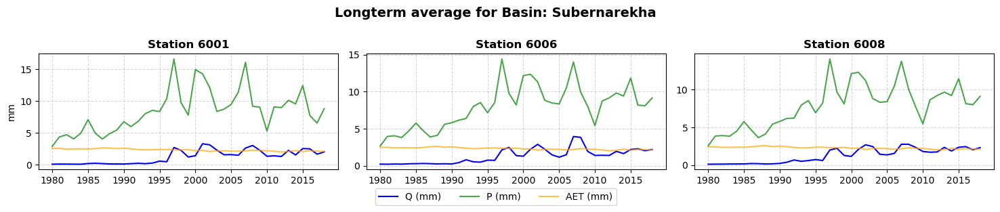

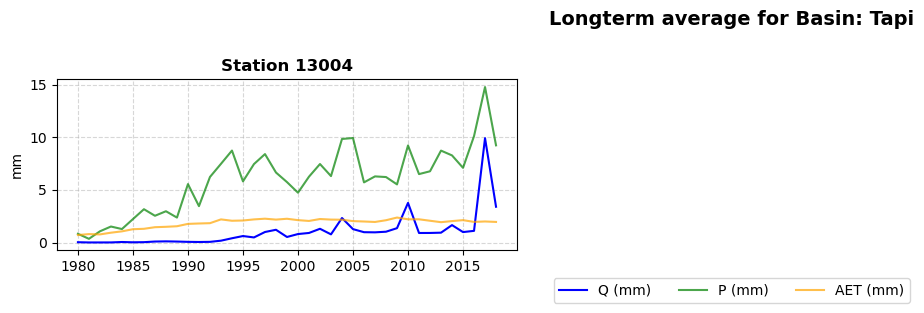

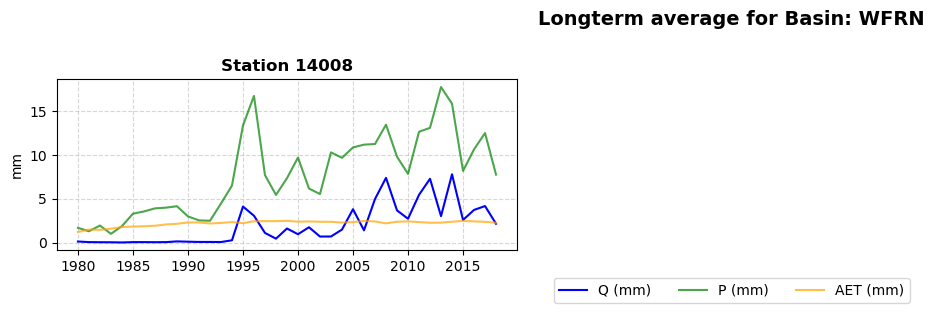

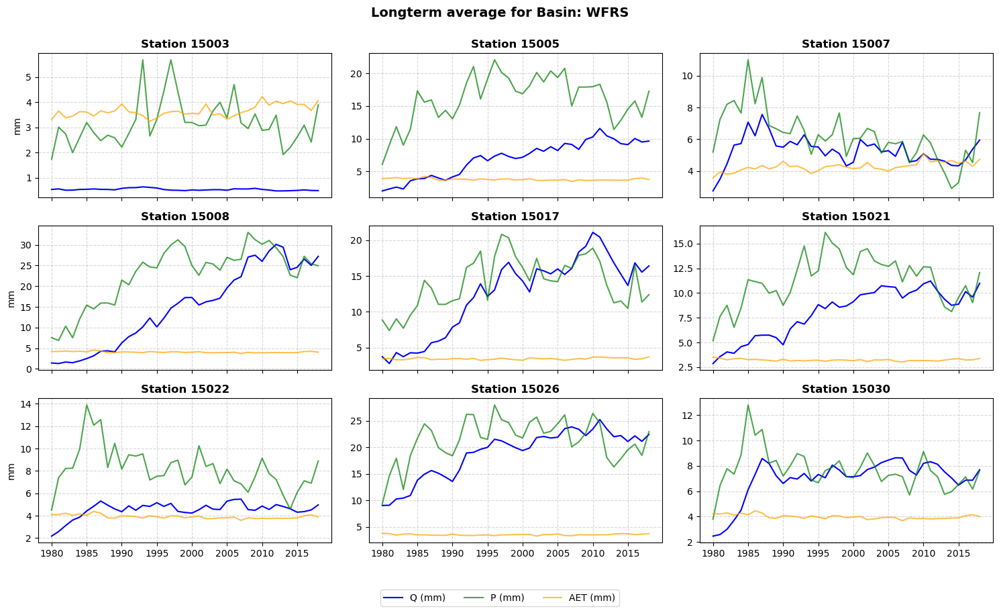

Plots saved to: C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Q\plots


In [17]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import math

# Paths
q_folder = r"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Q"
plot_folder = os.path.join(q_folder, "plots")
os.makedirs(plot_folder, exist_ok=True)

# Loop through each basin file
for file in os.listdir(q_folder):
    if not file.endswith(".xlsx") or file == "Basin_Station_Summary.xlsx":
        continue

    basin_name = os.path.splitext(file)[0]
    file_path = os.path.join(q_folder, file)
    
    # Read all stations in the basin
    xls = pd.ExcelFile(file_path)
    station_names = xls.sheet_names
    num_stations = len(station_names)
    
    # Arrange subplots in grid
    cols = 3  # adjust based on preference
    rows = math.ceil(num_stations / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3), sharex=True)
    axes = axes.flatten()  # to index subplots easily
    
    for i, station in enumerate(station_names):
        df = pd.read_excel(file_path, sheet_name=station)
        ax = axes[i]
        
        # Plot Annual Q, P, AET
        ax.plot(df["year"], df["ltm_Q"], label="Q (mm)", color="blue")
        ax.plot(df["year"], df["ltm_P"], label="P (mm)", color="green", alpha=0.7)
        ax.plot(df["year"], df["ltm_AET"], label="AET (mm)", color="orange", alpha=0.7)
        
        ax.set_title(f"Station {station}", fontsize=12, fontweight="bold")
        ax.grid(True, linestyle="--", alpha=0.5)
        if i % cols == 0:
            ax.set_ylabel("mm")
    
    # Remove empty subplots if any
    for j in range(num_stations, len(axes)):
        fig.delaxes(axes[j])
    
    # Add legend only once, place below plots
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower center", ncol=3, bbox_to_anchor=(0.5, -0.02))

    fig.suptitle(f"Longterm average for Basin: {basin_name}", fontsize=14, fontweight="bold")
    fig.tight_layout(rect=[0, 0.05, 1, 0.98])  # leave bottom 5% space for legend
    
    # Save figure
    save_path = os.path.join(plot_folder, f"{basin_name}_ltm_timeseries.png")
    plt.savefig(save_path, dpi=300)
    plt.show(fig)

print(f"Plots saved to: {plot_folder}")

In [20]:
import pandas as pd

summary_path = r"C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Basin_Station_Summary.xlsx"

# List of error sites
error_sites = ["17003", "17015", "4054", "5007", "5028", "16007", "17006", "3071", "4013", "4050", "13004", "14008"]

# Filter out error sites
filtered_df = summary_df[~summary_df["Gauge_ID"].astype(str).isin(error_sites)].copy()

# Append filtered data as Sheet2 without overwriting Sheet1
with pd.ExcelWriter(summary_path, mode="a", if_sheet_exists="replace", engine="openpyxl") as writer:
    filtered_df.to_excel(writer, sheet_name="ltm_sites", index=False)

print(f"Filtered data added as Sheet2 in: {summary_path}")


Filtered data added as Sheet2 in: C:\Users\PPOSA\OneDrive - The University of Melbourne\1 Poornima_Research_Work\6 Elasticity\Basin_Station_Summary.xlsx
